<center>
    <img src="https://github.com/TUIlmenauAMS/MLfAS_Tutorials/blob/main/images/mlfasp.png?raw=1">
</center>

#### Prof. Dr. -Ing. Gerald Schuller <br> Jupyter Notebook: Renato Profeta

[Applied Media Systems Group](https://www.tu-ilmenau.de/en/applied-media-systems-group/) <br>
[Technische Universität Ilmenau](https://www.tu-ilmenau.de/)

# Denoising Autoencoder

In [ ]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/RRo8sLTCc2M?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen referrerpolicy="strict-origin-when-cross-origin"></iframe>

The "Denoising Autoencoder" is basically the same as an Autoencoder, but instead of having a clean audio signal as its input, it has a noisy version.

Usually this noisy version has added noise, but it could also be other kinds of distortions.

The goal of the denoising Autoencoder is then to reconstruct the clean version of its input. Hence it is trained on noisy signals as trainings set. To avoid that the denoising Autoencoder learns a specific instance of the noise, an new instance of the noise is generated for each epoch of the training process.

So for our example we use the same autoencoder structure as before, and train it with an added noise.

The training 'for' loop then contains:
```python
Ypred=model(X+torch.randn(X.size())*0.05)```

To make it shift invariant, we can also include a cyclic ("round robin") shift as another type of distortion in the trainings loop, for the input X and the target Y:

```python
Xlast=X[:,:,-1].clone()
X[:,:,1:]=X[:,:,:-1].clone()
#round Robbin, shift 1 right
X[:,:,0]=Xlast.clone()
Ylast=Y[:,:,-1].clone()
Y[:,:,1:]=Y[:,:,:-1].clone()
#round Robbin, shift 1 right
Y[:,:,0]=Ylast.clone()```

The training then continues as usual with:
```python
Ypred=model(X)
loss=loss_fn(Ypred, Y)
if epoch%10==0:
    print(epoch, loss.item())
optimizer.zero_grad()
loss.backward()
optimizer.step()```

## Experiment 1 with stride=512

In [ ]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/u4hmSXiXI6I?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen referrerpolicy="strict-origin-when-cross-origin"></iframe>

In [ ]:
# -*- coding: utf-8 -*-
__author__ = 'Gerald Schuller'
__copyright__ = 'G.S.'

"""
convolutional autoencoder for audio signals.
Gerald Schuller, February 2020.
""";
# Ported to Jupyter Notebook by Renato Profeta, November 2020

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import numpy as np
import matplotlib.pyplot as plt
import sys
import os
import librosa

In [ ]:
if sys.version_info[0] < 3:
   # for Python 2
   import cPickle as pickle
else:
   # for Python 3
   import pickle

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device=", device)

device= cuda


In [ ]:
def signal2pytorch(x):
    #Function to convert a signal vector x, like a mono audio signal, into a 3-d Tensor that conv1d of Pytorch expects,
    #https://pytorch.org/docs/stable/nn.html
    #Argument x: a 1-d signal as numpy array
    #input x[batch,sample]
    #output: 3-d Tensor X for conv1d input.
    #for conv1d Input: (N,Cin,Lin), Cin: numer of input channels (e.g. for stereo), Lin: length of signal, N: number of Batches (signals)
    X = np.expand_dims(x, axis=0)  #add channels dimension (here only 1 channel)
    if len(x.shape)==1: #mono:
        X = np.expand_dims(X, axis=0)  #add batch dimension (here only 1 batch)
    X=torch.from_numpy(X)
    X=X.type(torch.Tensor)
    X=X.permute(1,0,2)  #make batch dimension first
    return X

In [ ]:
class Convautoenc(nn.Module):
    def __init__(self):
        super(Convautoenc, self).__init__()
        #Analysis Filterbank with downsampling of N=1024, filter length of 2N, but only N/2 outputs:
        self.conv1=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=2048, stride=512, padding=1023, bias=True) #Padding for 'same' filters (kernel_size/2-1)

        #Synthesis filter bank:
        self.synconv1=nn.ConvTranspose1d(in_channels=32, out_channels=1, kernel_size=2048, stride=512, padding=1023, bias=True)

    def encoder(self, x):
        #Analysis:
        x = self.conv1(x)
        y = torch.tanh(x)
        return y

    def decoder(self, y):
        #Synthesis:
        xrek= self.synconv1(y)
        return xrek

    def forward(self, x):
        y=self.encoder(x)
        #y=torch.round(y/0.125)*0.125
        xrek=self.decoder(y)
        return xrek

# Signal Flow Diagram of the Convolutional Autoencoder

In [ ]:
%%html
<img src="https://raw.githubusercontent.com/TUIlmenauAMS/MLfAS_Tutorials/master/images/ConvAutoencoder_ChatGPT Image May 29, 2026, 01_56_03 PM.png">

In [ ]:
!git clone https://github.com/TUIlmenauAMS/MLfAS_Tutorials/

Cloning into 'MLfAS_Tutorials'...
remote: Enumerating objects: 345, done.
remote: Counting objects: 100% (120/120), done.
remote: Compressing objects: 100% (115/115), done.
remote: Total 345 (delta 62), reused 5 (delta 5), pack-reused 225 (from 2)
Receiving objects: 100% (345/345), 101.82 MiB | 14.89 MiB/s, done.
Resolving deltas: 100% (161/161), done.


## Set up signal:

In [ ]:
batch=1
audio, samplerate = librosa.load("/content/MLfAS_Tutorials/audio/ACDC - Back In Black Intro.wav", mono=False, sr=None, offset=6)
audio[0,:]/=np.abs(audio[0,:]).max()
audio[1,:]/=np.abs(audio[1,:]).max()
X_train=signal2pytorch(audio[0,:]).to(device) #Convert to pytorch format, batch is first dimension, left stereo channel
X_test=signal2pytorch(audio[1,:]).to(device) #Convert to pytorch format, batch is first dimension, right stereo channel

##Generate Model:

In [ ]:
print("Generate Model:")
model = Convautoenc().to(device)
print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
print("Def. loss function:")
loss_fn = nn.MSELoss()  #MSE
#loss_fn = nn.L1Loss()

Ypred=model(X_train)

#Ypred=Ypred.detach()
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)

Y=X_train[:,:,:outputlen]  #the target signal with same length as model output

print("Input X.shape=", X_train.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
#print("max(max(Y))=", max(max(max(Y))))
#print("min(min(Y))=", min(min(min(Y))))
print("Y.type()=", Y.type())

Generate Model:
Total number of parameters: 131105
Def. loss function:
outputlen= 881666
Input X.shape= torch.Size([1, 1, 882000])
Target Y.shape= torch.Size([1, 1, 881666])
Target Y= tensor([[[-0.0021,  0.0010,  0.0031,  ..., -0.0969, -0.0991, -0.0316]]],
       device='cuda:0')
Y.type()= torch.cuda.FloatTensor


## Training:

In [ ]:
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
"""
try:
    checkpoint = torch.load("audio_autoenc.torch",map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
except IOError:
    print("fresh start")
""";

#optimrandomdir_pytorch.optimizer(model, loss_fn, X, Ypred, iterations=300, startingscale=1.0, endscale=0.0)
Ypred=model(X_train)
#Ypred=Ypred.detach()
print("Ypred=", Ypred)

#randdir=True # True for optimization of random direction, False for pytorch optimization
randdir=False

if randdir==True:
#optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X_train, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(4000):
        #distortions: shift and noise:
        #"""
        Xlast=X_train[:,:,-1].clone()
        X_train[:,:,1:]=X_train[:,:,:-1].clone() #round Robbin, shift 1 right
        X_train[:,:,0]=Xlast.clone()
        Ylast=Y[:,:,-1].clone()
        Y[:,:,1:]=Y[:,:,:-1].clone() #round Robbin, shift 1 right
        Y[:,:,0]=Ylast.clone()
        #"""
        #Make it robust against the added noise:
        Ypred=model(X_train+torch.randn(X_train.size()).to(device)*0.05)
        #print("Ypred.shape=", Ypred.shape)
        #loss wants batch in the beginning! (Batch, Classes,...)
        #Ypredp=Ypred.permute(1,2,0)
        #Yp=Y.permute(1,0)
        #print("Ypredp.shape=", Ypredp.shape, "Yp.shape=", Yp.shape )
        loss=loss_fn(Ypred, Y)
        if epoch%10==0:
            print(epoch, loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

Ypred= tensor([[[0.0076, 0.0108, 0.0107,  ..., 0.0153, 0.0134, 0.0033]]],
       device='cuda:0', grad_fn=<ConvolutionBackward0>)
0 0.013066022656857967
10 0.012605070136487484
20 0.011900513432919979
30 0.010965216904878616
40 0.009997242130339146
50 0.009208416566252708
60 0.008614882826805115
70 0.008157833479344845
80 0.007797989994287491
90 0.007507995702326298
100 0.007270232308655977
110 0.0070602791383862495
120 0.006863095331937075
130 0.006702355109155178
140 0.006547221448272467
150 0.0064080278389155865
160 0.006259441375732422
170 0.006145417224615812
180 0.006026024930179119
190 0.00590390432626009
200 0.005799423437565565
210 0.005705139599740505
220 0.005594945512712002
230 0.005505729001015425
240 0.005408218130469322
250 0.0053227124735713005
260 0.005233695264905691
270 0.005171273835003376
280 0.00509470421820879
290 0.005021708086133003
300 0.004972443915903568
310 0.004890939220786095
320 0.004842063877731562
330 0.0047947014681994915
340 0.0047283777967095375
350

ww= OrderedDict({'conv1.weight': tensor([[[ 5.4356e-03,  5.9474e-03,  9.2690e-03,  ...,  5.4666e-03,
           7.5920e-03,  7.0256e-03]],

        [[ 3.7102e-03, -2.0259e-03, -7.7524e-03,  ..., -2.3027e-03,
          -2.6782e-03,  9.4982e-05]],

        [[ 1.0768e-02,  1.4992e-02,  1.7436e-02,  ...,  2.6998e-03,
          -2.0077e-03, -7.1001e-03]],

        ...,

        [[-3.4017e-03, -6.3836e-03, -8.4246e-03,  ...,  2.3161e-03,
          -1.4263e-03, -7.5726e-03]],

        [[-8.2350e-03, -1.6986e-03,  8.8318e-04,  ..., -1.1875e-02,
          -1.0504e-02, -7.3993e-03]],

        [[ 6.0900e-03,  8.5869e-03,  1.0448e-02,  ...,  6.4659e-03,
           6.5503e-03,  1.0512e-02]]], device='cuda:0'), 'conv1.bias': tensor([ 4.3830e-04, -8.1679e-05, -1.2034e-04, -1.4500e-04, -1.7257e-04,
         1.7654e-04, -1.1986e-06, -2.5219e-04,  8.2449e-05, -5.3865e-05,
        -9.8445e-05,  1.1174e-04,  1.4494e-04,  1.7593e-04, -8.3480e-05,
        -1.6610e-04, -1.4133e-04,  4.4017e-04, -1.8035e-04, 

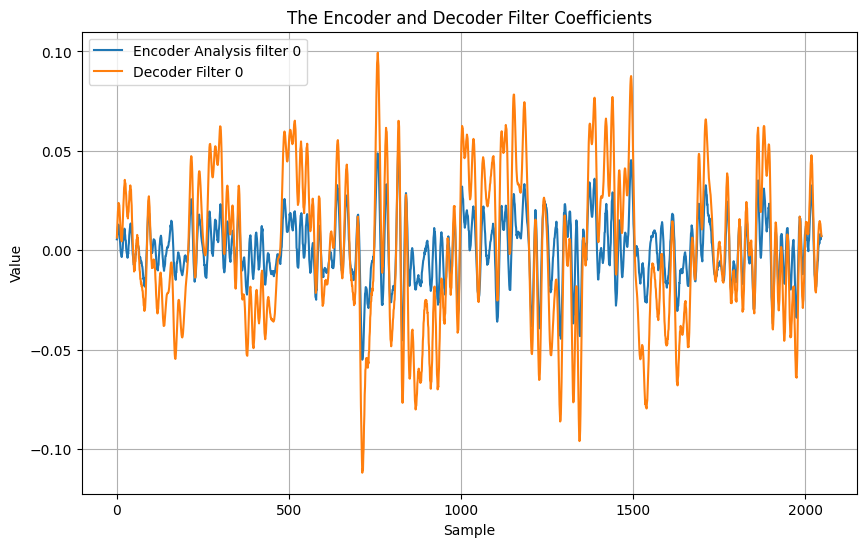

In [ ]:
"""
torch.save({#'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict()}, "audio_autoenc.torch")
"""

ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,6))
plt.plot(np.transpose(np.array(ww['conv1.weight'][0:1,0,:].cpu())))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:].cpu())))
plt.legend(('Encoder Analysis filter 0', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

predictions.shape= (1, 1, 881666)


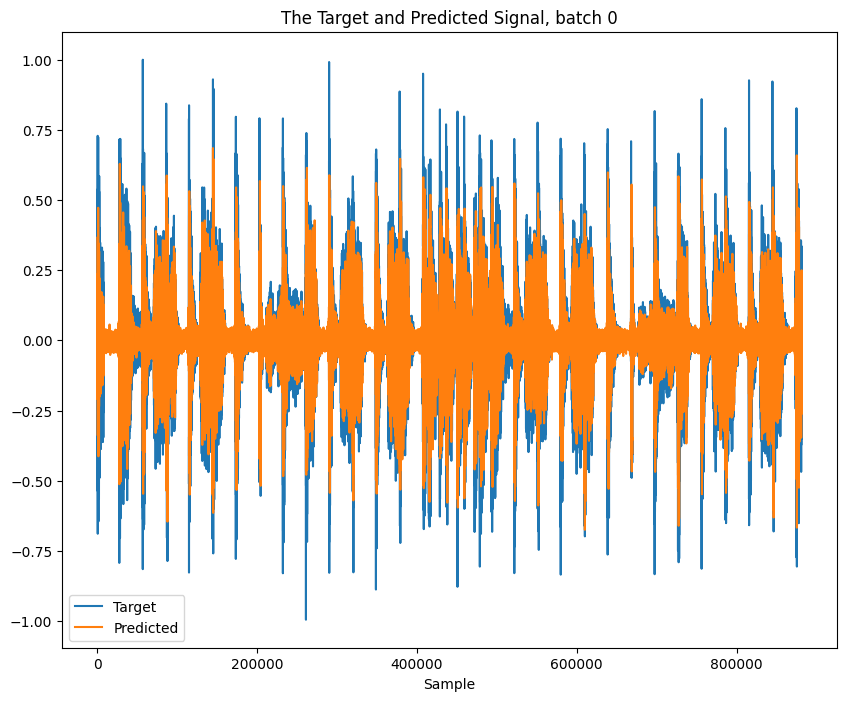

In [ ]:
#Test on training set:
Xnoise=(X_train+torch.randn(X_train.size()).to(device)*0.05)
#Xnoise=torch.cat((torch.zeros(1,1,100), Xnoise),dim=-1)
predictions=model(Xnoise).cpu() # Make Predictions based on the obtained weights, on training set
predictions=predictions.detach()
predictions=np.array(predictions)
Y=np.array(Y.cpu()) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#convert to numpy:
#https://discuss.pytorch.org/t/how-to-transform-variable-into-numpy/104/2
#Plot target signal and output of autoencoder:
plt.figure(figsize=(10,8))
for b in range(batch):
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.show()

Xnoise=Xnoise.detach()
Xnoise=np.array(Xnoise.cpu())
xnoise=Xnoise[:,0,:]
#xnoise=np.transpose(xnoise)
#xnoise=np.clip(xnoise, -1.0,1.0)

xrek=predictions[:,0,:]  #remove unnecessary dimension for playback
#xrek=np.transpose(xrek)
#xrek=np.clip(xrek, -1.0,1.0)




In [ ]:
import IPython.display as ipd
display(ipd.Audio(xnoise, rate=samplerate));

In [ ]:
import IPython.display as ipd
display(ipd.Audio(xrek, rate=samplerate));

Observe that there is now a bigger difference to the original.

Observe that the reconstructed version sounds very muffled.

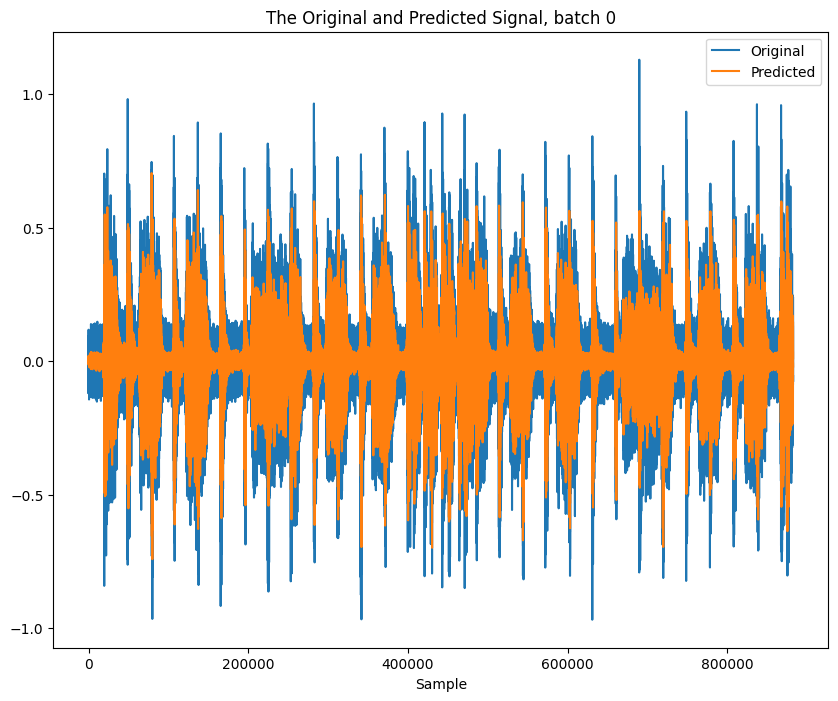

In [ ]:
#Test on Verification set:
X_test_shifted_100 = nn.ConstantPad1d(100, 0)(X_test)
x=X_test_shifted_100+torch.from_numpy((np.random.normal(scale=0.04, size=X_test_shifted_100.shape))).to(device).float()
predictions=model(x).cpu() # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)

x_numpy = x.detach().cpu().numpy()
plt.figure(figsize=(10,8))
for b in range(batch):
    plt.plot(np.array(x_numpy[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Original','Predicted'))
    plt.title('The Original and Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.show()
xrek=predictions[:,0,:]

In [ ]:
display(ipd.Audio(x[:,0,:].cpu().numpy(), rate=samplerate));

In [ ]:
display(ipd.Audio(xrek, rate=samplerate));

**Observe** that here the difference is similar.

**Observe** that it is similarly muffled.

At least the shift sensitivity is not there because of the way we trained it.

## Expriment 2 with Reduced stride=32

In [ ]:
%%html
<iframe width="560" height="315" src="https://www.youtube.com/embed/M4e9YcSUSsU?rel=0" frameborder="0" allow="accelerometer; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen referrerpolicy="strict-origin-when-cross-origin"></iframe>

To obtain a better audio quality we now reduce the stride (the downsampling and upsampling factor) to 32.

In [ ]:
class Convautoenc(nn.Module):
    def __init__(self):
        super(Convautoenc, self).__init__()
        #Analysis Filterbank with downsampling of N=1024, filter length of 2N, but only N/2 outputs:
        self.conv1=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=2048, stride=32, padding=1023, bias=True) #Padding for 'same' filters (kernel_size/2-1)

        #Synthesis filter bank:
        self.synconv1=nn.ConvTranspose1d(in_channels=32, out_channels=1, kernel_size=2048, stride=32, padding=1023, bias=True)

    def encoder(self, x):
        #Analysis:
        x = self.conv1(x)
        y = torch.tanh(x)
        return y

    def decoder(self, y):
        #Synthesis:
        xrek= self.synconv1(y)
        return xrek

    def forward(self, x):
        y=self.encoder(x)
        #y=torch.round(y/0.125)*0.125
        xrek=self.decoder(y)
        return xrek

In [ ]:
batch=1
audio, samplerate = librosa.load("/content/MLfAS_Tutorials/audio/ACDC - Back In Black Intro.wav", mono=False, sr=None, offset=6)
audio[0,:]/=np.abs(audio[0,:]).max()
audio[1,:]/=np.abs(audio[1,:]).max()
X_train=signal2pytorch(audio[0,:]).to(device) #Convert to pytorch format, batch is first dimension
X_test=signal2pytorch(audio[1,:]).to(device) #Convert to pytorch format, batch is first dimension

In [ ]:
print("Generate Model:")
model = Convautoenc().to(device)
print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
print("Def. loss function:")
loss_fn = nn.MSELoss()  #MSE
#loss_fn = nn.L1Loss()

Ypred=model(X_train)

#Ypred=Ypred.detach()
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)

Y=X_train[:,:,:outputlen]  #the target signal with same length as model output

print("Input X.shape=", X_train.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
#print("max(max(Y))=", max(max(max(Y))))
#print("min(min(Y))=", min(min(min(Y))))
print("Y.type()=", Y.type())

Generate Model:
Total number of parameters: 131105
Def. loss function:
outputlen= 881986
Input X.shape= torch.Size([1, 1, 882000])
Target Y.shape= torch.Size([1, 1, 881986])
Target Y= tensor([[[-0.0021,  0.0010,  0.0031,  ...,  0.0486,  0.0698,  0.1591]]],
       device='cuda:0')
Y.type()= torch.cuda.FloatTensor


In [ ]:
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
"""
try:
    checkpoint = torch.load("audio_autoenc.torch",map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
except IOError:
    print("fresh start")
""";

#optimrandomdir_pytorch.optimizer(model, loss_fn, X, Ypred, iterations=300, startingscale=1.0, endscale=0.0)
Ypred=model(X_train)
#Ypred=Ypred.detach()
print("Ypred=", Ypred)

#randdir=True # True for optimization of random direction, False for pytorch optimization
randdir=False

if randdir==True:
#optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X_train, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(4000):
        #distortions: shift and noise:
        #"""
        Xlast=X_train[:,:,-1].clone()
        X_train[:,:,1:]=X_train[:,:,:-1].clone() #round Robbin, shift 1 right
        X_train[:,:,0]=Xlast.clone()
        Ylast=Y[:,:,-1].clone()
        Y[:,:,1:]=Y[:,:,:-1].clone() #round Robbin, shift 1 right
        Y[:,:,0]=Ylast.clone()
        #"""
        Ypred=model(X_train+torch.randn(X_train.size()).to(device)*0.05)
        #print("Ypred.shape=", Ypred.shape)
        #loss wants batch in the beginning! (Batch, Classes,...)
        #Ypredp=Ypred.permute(1,2,0)
        #Yp=Y.permute(1,0)
        #print("Ypredp.shape=", Ypredp.shape, "Yp.shape=", Yp.shape )
        loss=loss_fn(Ypred, Y)
        if epoch%10==0:
            print(epoch, loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

Ypred= tensor([[[-0.0148, -0.0168, -0.0084,  ..., -0.0176,  0.0195, -0.0141]]],
       device='cuda:0', grad_fn=<ConvolutionBackward0>)
0 0.014458396472036839
10 0.009245413355529308
20 0.0070459675043821335
30 0.005900997202843428
40 0.005102505441755056
50 0.004541468806564808
60 0.0040894863195717335
70 0.003745897440239787
80 0.0034395125694572926
90 0.0031809366773813963
100 0.0029717993456870317
110 0.002780495211482048
120 0.002609862480312586
130 0.002466551959514618
140 0.0023284032940864563
150 0.002212077844887972
160 0.002106767613440752
170 0.002007358008995652
180 0.001917429268360138
190 0.0018401151755824685
200 0.0017728883540257812
210 0.0017088489839807153
220 0.0016468609683215618
230 0.001594918197952211
240 0.00154535798355937
250 0.0015046484768390656
260 0.0014589866623282433
270 0.0014234251575544477
280 0.0013951794244349003
290 0.0013620421523228288
300 0.001327459467574954
310 0.0013015703298151493
320 0.0012769409222528338
330 0.0012536532012745738
340 0.00

First you will notice that it trains or optimizes much slower, because it has to process more data.

ww= OrderedDict({'conv1.weight': tensor([[[ 7.6151e-03, -5.1401e-03, -7.6032e-03,  ..., -3.9798e-03,
          -1.5510e-03,  9.9109e-04]],

        [[-1.0005e-02, -1.7784e-03, -2.8654e-03,  ..., -1.5938e-02,
          -1.6777e-05, -1.2543e-03]],

        [[ 7.8702e-03,  6.9710e-03,  9.5232e-03,  ..., -8.2813e-03,
          -1.1473e-02, -4.7948e-03]],

        ...,

        [[-2.9664e-03, -5.2695e-03, -7.6245e-03,  ...,  5.4113e-03,
           2.4299e-03, -2.1368e-03]],

        [[-9.2727e-03, -1.2583e-02,  1.2591e-03,  ..., -1.0786e-02,
          -5.0641e-04, -3.0677e-04]],

        [[ 6.4471e-03, -3.3179e-03, -6.3508e-03,  ...,  1.0621e-03,
          -1.0197e-03,  1.7658e-03]]], device='cuda:0'), 'conv1.bias': tensor([ 0.0095,  0.0165, -0.0186, -0.0070, -0.0020, -0.0103,  0.0075, -0.0064,
         0.0026, -0.0177, -0.0024, -0.0002, -0.0106, -0.0041,  0.0132, -0.0161,
        -0.0109,  0.0153, -0.0098, -0.0105, -0.0158,  0.0029,  0.0099,  0.0055,
         0.0036, -0.0108, -0.0192, -0.0

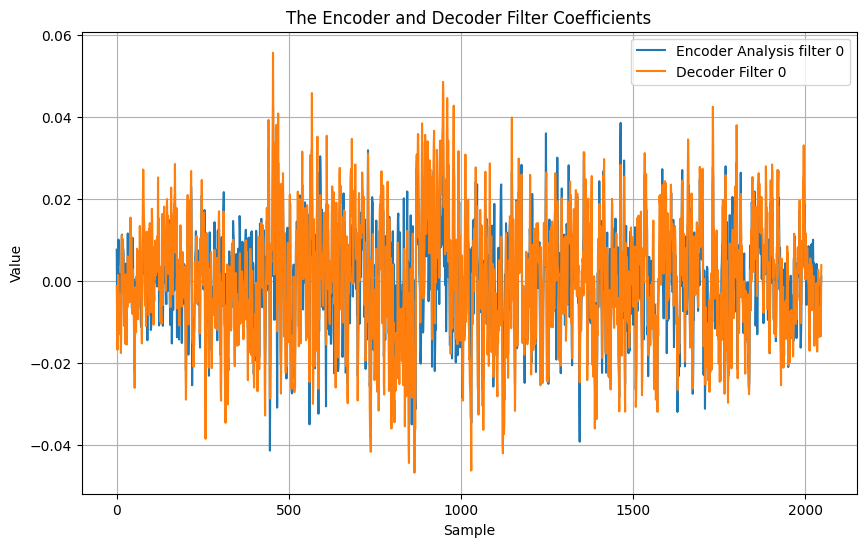

In [ ]:
"""
torch.save({#'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict()}, "audio_autoenc.torch")
"""

ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,6))
plt.plot(np.transpose(np.array(ww['conv1.weight'][0:1,0,:].cpu())))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:].cpu())))
plt.legend(('Encoder Analysis filter 0', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

predictions.shape= (1, 1, 881986)


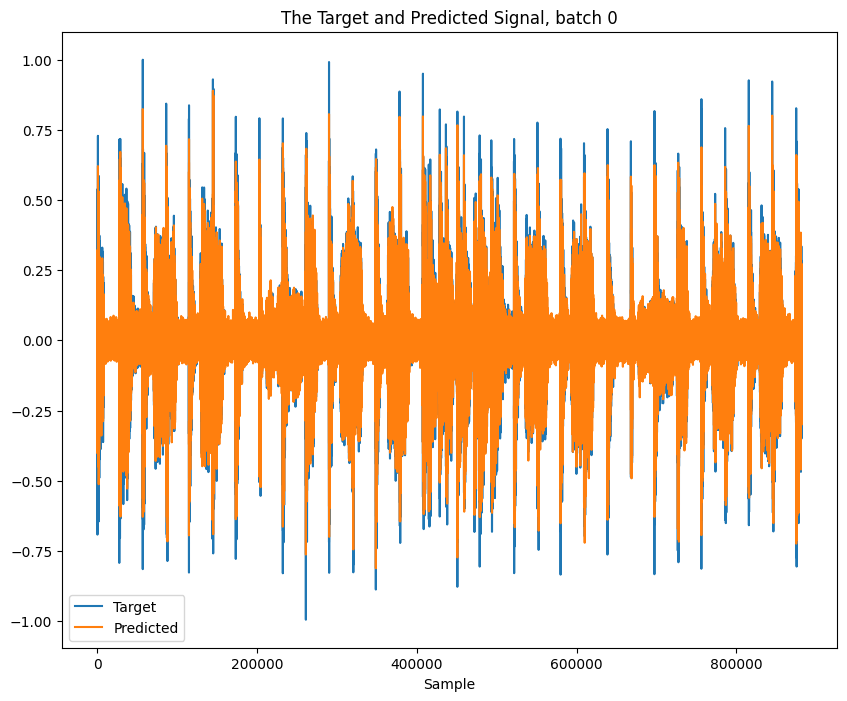

In [ ]:
#Test on training set:
Xnoise=(X_train+torch.randn(X_train.size()).to(device)*0.05)
#Xnoise=torch.cat((torch.zeros(1,1,100), Xnoise),dim=-1)
predictions=model(Xnoise).cpu() # Make Predictions based on the obtained weights, on training set
predictions=predictions.detach()
predictions=np.array(predictions)
Y=np.array(Y.cpu()) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#convert to numpy:
#https://discuss.pytorch.org/t/how-to-transform-variable-into-numpy/104/2
#Plot target signal and output of autoencoder:
plt.figure(figsize=(10,8))
for b in range(batch):
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.show()

Xnoise=Xnoise.detach()
Xnoise=np.array(Xnoise.cpu())
xnoise=Xnoise[:,0,:]
#xnoise=np.transpose(xnoise)
#xnoise=np.clip(xnoise, -1.0,1.0)

xrek=predictions[:,0,:]  #remove unnecessary dimension for playback
#xrek=np.transpose(xrek)
#xrek=np.clip(xrek, -1.0,1.0)




In [ ]:
import IPython.display as ipd
display(ipd.Audio(xnoise, rate=samplerate));

In [ ]:
import IPython.display as ipd
display(ipd.Audio(xrek, rate=samplerate));

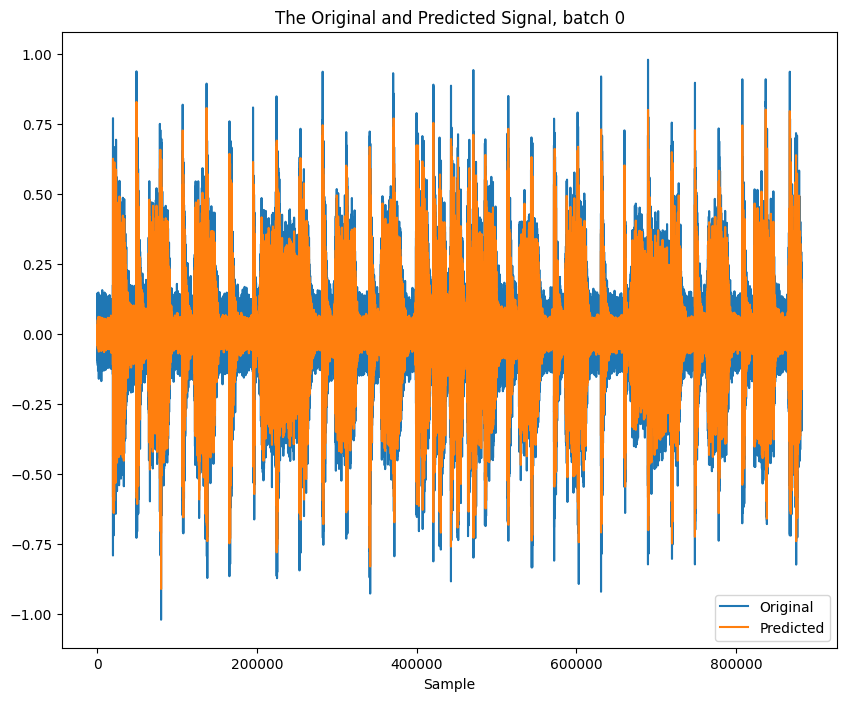

In [ ]:
#Test on Verification set:
X_test_shifted_100 = nn.ConstantPad1d(100, 0)(X_test)
x=X_test_shifted_100+torch.from_numpy((np.random.normal(scale=0.04, size=X_test_shifted_100.shape))).to(device).float()
predictions=model(x).cpu() # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)

x_numpy = x.detach().cpu().numpy()
plt.figure(figsize=(10,8))
for b in range(batch):
    plt.plot(np.array(x_numpy[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Original','Predicted'))
    plt.title('The Original and Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.show()
xrek=predictions[:,0,:]

In [ ]:
display(ipd.Audio(x_numpy[:,0,:], rate=samplerate));

In [ ]:
display(ipd.Audio(xrek, rate=samplerate));

But when it finally plays back the reconstructed versions of the training and verification set, you can hear that the signals indeed sound a bit better, less muffled!

This shows the effect of the stride: Too low means long training, too high means less quality.

# Task:

Make a denoising autoencoder to restore and audio signal, like from an old tape recording. For that, train the system on clean audio signals, where you add the xpected noise and distortion you expect from the old tape recording.

Then apply the trained autoencoder to the old tape recording.